# Introduction

Image noise is a random distortion in the brightness or color in an image. It is an unwanted element in a photograph that skews the original intention of the photo. There are several methods that could be used to reduce noise in any photo. For this report, I will walkthrough how to successfully denoise images riddled with salt and pepper noise. 

Salt and pepper noise is found only in grayscale images (black and white images). An easy way to think about it is, salt in pepper = white spots in the dark regions or pepper in salt = black spots in the white regions. It consists of random pixels in an image being set to black/white, resembling the appearance of salt and pepper littering a photo. The more noise in the image, the harder it is to assertain what the photo is. 

I will begin by adding salt and pepper to a set of images and then proceed to create filters that can denoise the noise and compare their results. Based off of different parameters, we will be able to see which filter is better at denoising image. 

## What filters can be used to denoise salt and pepper noise?

In this report, I will use two different filters , the Mean filter and the Median filter, to attempt to denoise the salt and pepper noise. 

The **Mean filter** starts with an image and produces from it a new, filtered image with modified pixel colors. Mean also means the average of numbers and it is defined as 
$$
m = \frac{1}{n}\ \sum_{i=1}^{n} x_i  \
$$
Let $P[i,j]$ denote the pixel in the $i$-th row and $j$-th column of the original image, and let $F[i,j]$ denote the pixel in the same row and column of the filtered image. The color of $F[i,j]$ is computed as: 
1. We select an n x n square of pixels of the original image that has P[i,j] at the center.
2. We compute the mean of values of pixels contained in the square.
3. This mean value gives the color of the pixel. $F[i,j]$. 
We can use `np.mean` from the package NumPy to create a `mean_filter` function that conducts the steps listed above. 

Similarly, the **Median filter** takes the median of the pixels in a square. An odd-sized array is preferred for median filters because it ensures a unique middle middle without averaging two pixels that are next to each other. The median filter works as follows: 
1. For each pixel $P[i,j]$ of the original image we select a n x n square of pixels that has $P[i,j]$ at the center. 
2. We compute the median of values of all pixels in the square.
3. This median is the color of the pixel $F[i,j]$ in the filtered image.
We can use `np.median` from the Python package NumPy to create a `median_filter` function to rid our image of noise. 

## Adding salt and pepper noise

We begin by uploading our chosen image and converting our image to grayscale. Salt-and-pepper noise can only be added in a grayscale image. First we `import matplotlib.pyplot` and `import numpy` which we will use for our data visualization and numerical computation Using `plt.imread`, the code reads our motorbike image file and stores it as an array. The image is loaded as a 3D array (height x width x `3`). This represents the RGB color channels. We want to collapse the three color channels down to one. 

Next, we must convert our image to gray by taking the mean across the color channels `motorbike.mean(axis=2)` that will result in a 2D array. 


In [1]:
import matplotlib.pyplot as plt #Import libraries
import numpy as np

(-0.5, 639.5, 551.5, -0.5)

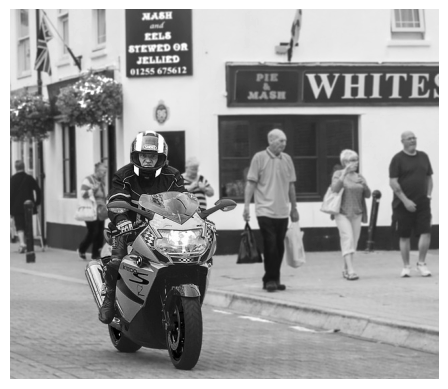

In [2]:
motorbike = plt.imread('motorbike.png')

motorbike_gray = motorbike.mean(axis=2) #Converts to grayscale

# Shows our image in grayscale. Specify vmin=0 and vmax=1 to make sure that it is drawing our grayscale values
plt.imshow(motorbike_gray, cmap='gray', vmin=0, vmax=1)
plt.axis('off')

Now that we have uploaded our image, we can begin to create a function `sp_noise(img, noise)` that adds salt and pepper noise to an image. Its first argument `img` should be a `2`-dimensional numpy array representing the image and `noise` should be the fraction of pixels that are to be replaced by noise. 

First, we make a copy of our array that we can add noise to so that we don't messup our original image and can make comparisons to the noisy and filtered images. Using the `np.random.random` function, we can randomly introduce salt and pepper noise to our rows and columns of our image between `0` and `1`. We can then use a Boolean array (`salt_mask`) with `True` in the locations that we want to add salt noise and `False` everywhere else. Then, we can use `salt_mask` as a slice on array. We can repeat these steps for pepper noise (`pepper_mask`).


In [3]:
def sp_noise(img, noise):
    noisy_img = img.copy()
    num_rows, num_cols = img.shape
    random_array = np.random.random((num_rows, num_cols))
    
    # Creates a Boolean mask where `True` says the position where the random noise value
    # is greater than 1 - noise (% chance of "salt" noise)
    salt_mask = (noise > 1 - noise)
    noisy_img[salt_mask] = 1 #Sets those pixels to white
    
    # Another mask where `True` says the positions where the noise is less then 
    # noise parameter (% chance for "pepper" noise). 
    pepper_mask = (random_array < noise)
    noisy_img[pepper_mask] = 0 # Sets those pixels to black
    
    return noisy_img

(-0.5, 639.5, 551.5, -0.5)

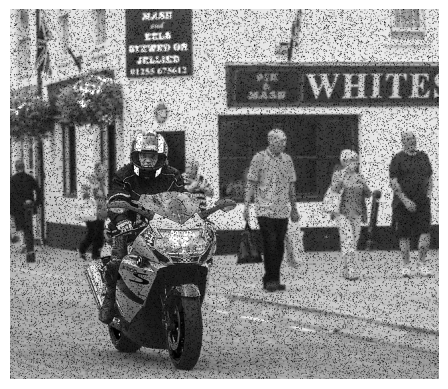

In [4]:
noisy_motorbike = sp_noise(motorbike_gray, 0.1) #About 10% of should be noise, half black half white
plt.imshow(noisy_motorbike, cmap='gray', vmin=0, vmax=1)
plt.axis('off')

## Edge Pixels

Before we implement the mean and median filters, we need to deal deal with the issue of pixels that are close to image edges. We need to work through this so that our operations can be applied to the borders without having worry about going outside the image edges. One way to deal with this is to pad the image by adding a border on each side of some fixed color. 

I worked to build a `get_padded_img(img, s)` that takes as its first argument a 2-dimensional numpy array `img` representing the image and `s` which is the size of square of pixels. This function aims to dynamically add a suitable padded border based on the size of the array `s`. For example, if we are using a `3` by `3` grid (`s=3`), we need to add one extra row/column on all sides. By using the floor division operator , `//`, to divide `s` by `2`, the result is rounded down so we get the sufficient padding we need. If `s=5`, then `w=2` because `5/2` is 2.5 and `5//2` is 2 (rounded down result). Then we define a larger array with an extra row(s) on top/bottom based on `w` and an extra columm(s) based on `w`. 

Finally, `padded_img[w:-w, w:-w]` places the noisy array in the center of the padded array and now we have a dynamic padding function that can change when `s` is adjusted. 

In [5]:
def get_padded_img(img, s):
    noisy_img = img.copy()
    num_rows, num_cols = img.shape
    
    # Compute the padding width (w)
    w = s // 2
    
    # Creates a new array filled with ones (white border)
    padded_img = np.ones((num_rows+2*w, num_cols+2*w))
    
    padded_img[w:-w, w:-w] = noisy_img
    return padded_img

In [6]:
# Call our function to add a 1-pixel border
padded_img = get_padded_img(noisy_motorbike, s=3) #Array assigned is 3 x 3

## Creating our Mean Filter

Now that we have dealt with our edge pixels issue, we can now create our `mean_filter(img, s)` function that takes as its first argument a 2-dimensional numpy array `img` representing an image, and returns a numpy array obtained by applying to `img` the mean filter. The second argument `s` is the size of square of pixels used by the filter. 

We iterate through every image to extract a kernel of size `s x s` from our `padded_img` that was defined above. Then we replace the pixel at `(i,j)` with an average of the surrounding pixels by taking the `np.mean` of the `grid` that was extracted. 

In [7]:
def mean_filter(img, s):
    filtered_img = img.copy()
    num_rows, num_cols = img.shape
    
    for i in range(num_rows):
        for j in range(num_cols):
            grid = padded_img[i:i + s, j:j + s] #Extracts our grid from our padded image
            filtered_img[i,j] = np.mean(grid)
            
    return filtered_img #return our mean filtered image

(-0.5, 639.5, 551.5, -0.5)

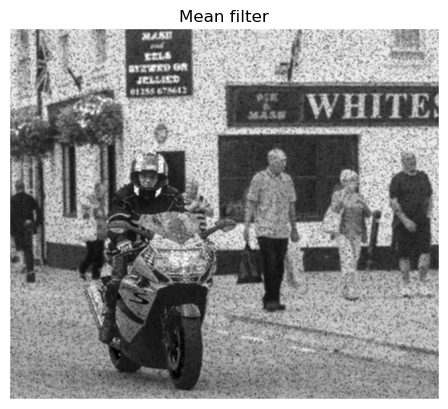

In [8]:
mean_filtered_img = mean_filter(noisy_motorbike, s=3)
plt.imshow(mean_filtered_img, cmap='gray', vmin=0, vmax=1)
plt.title('Mean filter')
plt.axis('off')

## Creating our Median Filter

We can also create our `median_filter(img,s)` in a similar manner as our `mean_filter(img,s)`. This function still takes in a numpy `img` array as its first argument that represents our image, and takes our second argument `s` as the size of squares used by the filter. 

The `median_filter(img,s)` is almost identical to the `mean_filter(img,s)` but instead of using `np.mean` over our `grid`, we use `np.median` to take the median of our pixels.  

In [9]:
def median_filter(img, s):
    filtered_img = img.copy()
    num_rows, num_cols = img.shape
    
    for i in range(num_rows):
        for j in range(num_cols):
            grid = padded_img[i:i + s, j:j + s]
            # Adjust `np.mean` to `np.median` 
            filtered_img[i,j] = np.median(grid)
            
    return filtered_img #Return our median filtered image

(-0.5, 639.5, 551.5, -0.5)

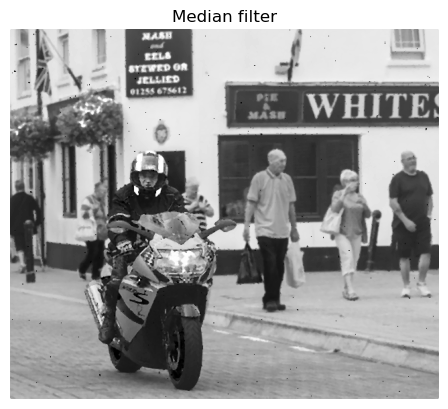

In [10]:
median_filtered_img = median_filter(noisy_motorbike, s=3)
plt.imshow(median_filtered_img, cmap='gray', vmin=0, vmax=1)
plt.title('Median filter')
plt.axis('off')

## Which filter is most suitable to reducing salt and pepper noise? 

First, let's compare all our images generated side by side to see what filter works best. Using the `plt.subplot` function, we can see how our filters compare to our original and noisy images that we generated in the beginning. 

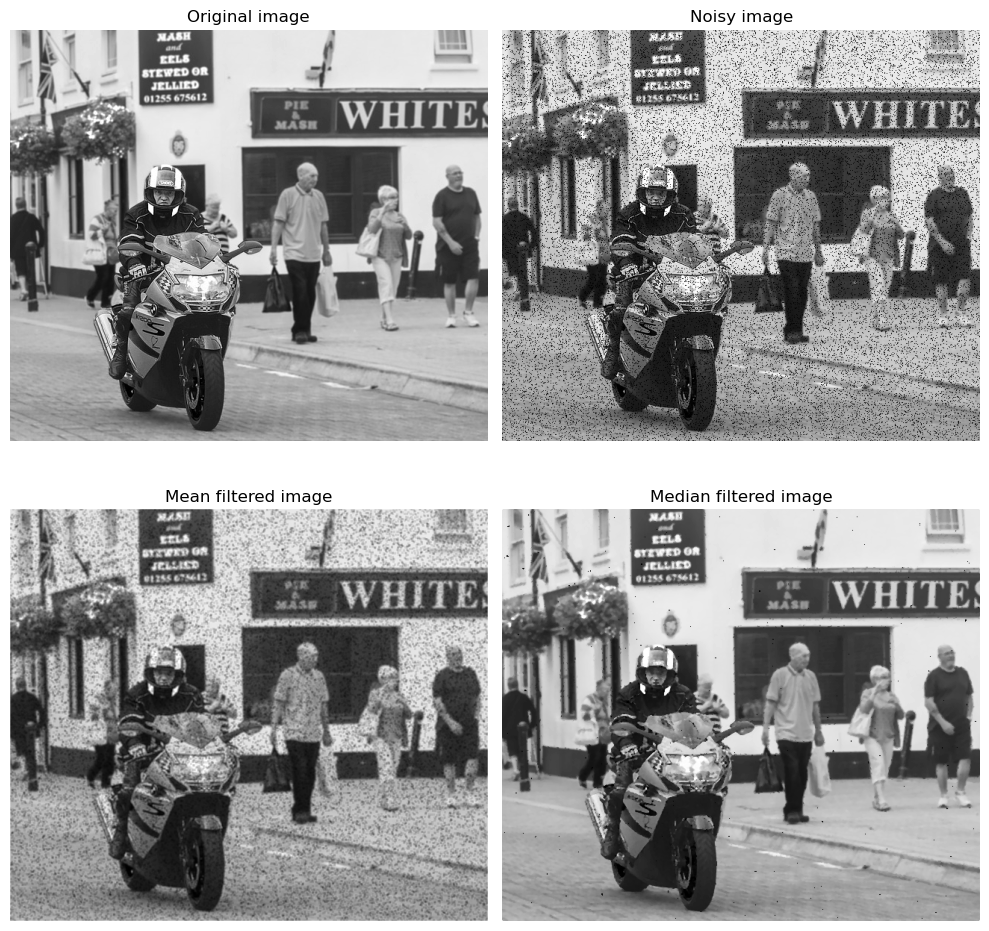

In [11]:
plt.figure(figsize=(10,10))

plt.subplot(2,2,1)
plt.imshow(motorbike_gray,cmap='gray',vmin=0,vmax=1)
plt.title('Original image')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(noisy_motorbike,cmap='gray',vmin=0,vmax=1)
plt.title('Noisy image')
plt.axis('off')

plt.subplot(2,2,3)
plt.imshow(mean_filtered_img,cmap='gray',vmin=0,vmax=1)
plt.title('Mean filtered image')
plt.axis('off')

plt.subplot(2,2,4)
plt.imshow(median_filtered_img,cmap='gray',vmin=0,vmax=1)
plt.title('Median filtered image')
plt.axis('off')

plt.tight_layout()

From these image comparisons, the median filter works significantly better for reducing salt-and-pepper noise. The median filter is better because it selects the middle pixel rather than averaging all values together (including outliers). With these outliers, our mean filter could be skewed. The median filter can discard the outliers because they wouldn't be close to the middle. 

## What happens as the value of `s` in these filters is increased?

In [12]:
padded_img = get_padded_img(noisy_motorbike, s=5)
mean_filtered_img5 = mean_filter(noisy_motorbike, s=5)
median_filtered_img5 = median_filter(noisy_motorbike, s=5)

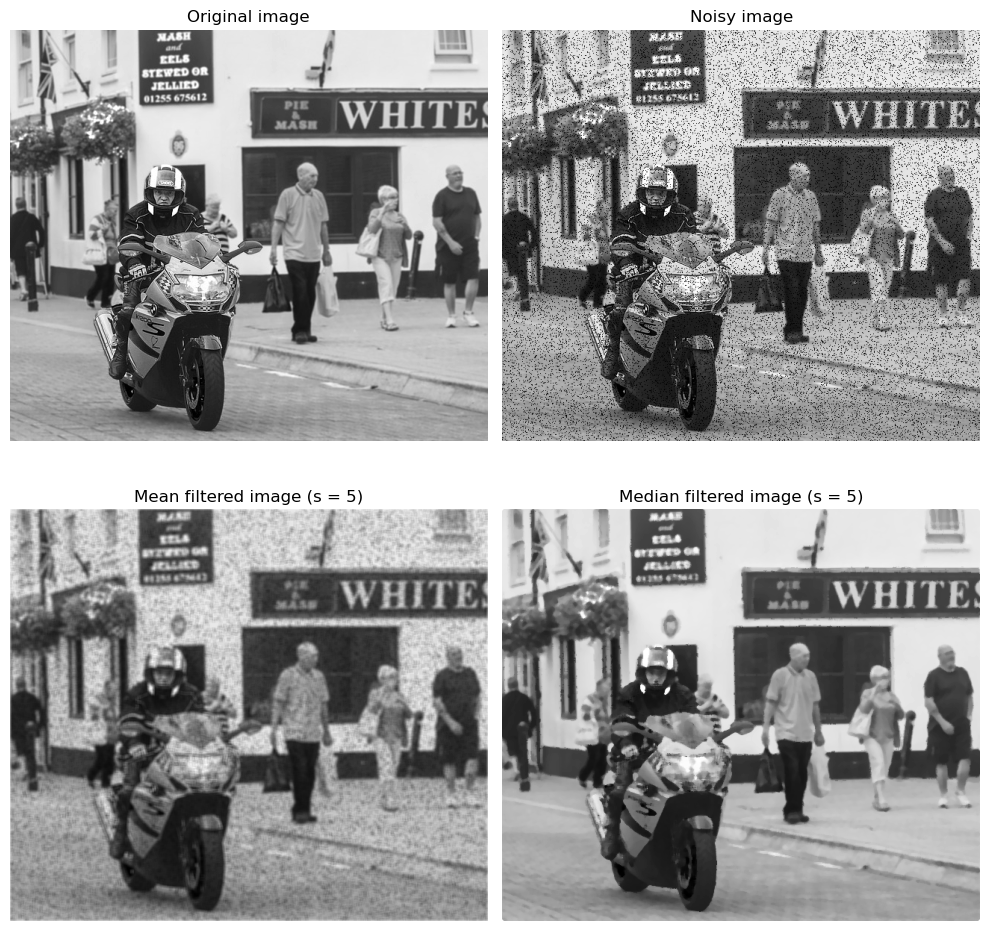

In [13]:
plt.figure(figsize=(10,10))

plt.subplot(2,2,1)
plt.imshow(motorbike_gray,cmap='gray',vmin=0,vmax=1)
plt.title('Original image')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(noisy_motorbike,cmap='gray',vmin=0,vmax=1)
plt.title('Noisy image')
plt.axis('off')

plt.subplot(2,2,3)
plt.imshow(mean_filtered_img5,cmap='gray',vmin=0,vmax=1)
plt.title('Mean filtered image (s = 5)')
plt.axis('off')

plt.subplot(2,2,4)
plt.imshow(median_filtered_img5,cmap='gray',vmin=0,vmax=1)
plt.title('Median filtered image (s = 5)')
plt.axis('off')

plt.tight_layout()

In [14]:
padded_img = get_padded_img(noisy_motorbike, s=7)
mean_filtered_img7 = mean_filter(noisy_motorbike, s=7)
median_filtered_img7 = median_filter(noisy_motorbike, s=7)

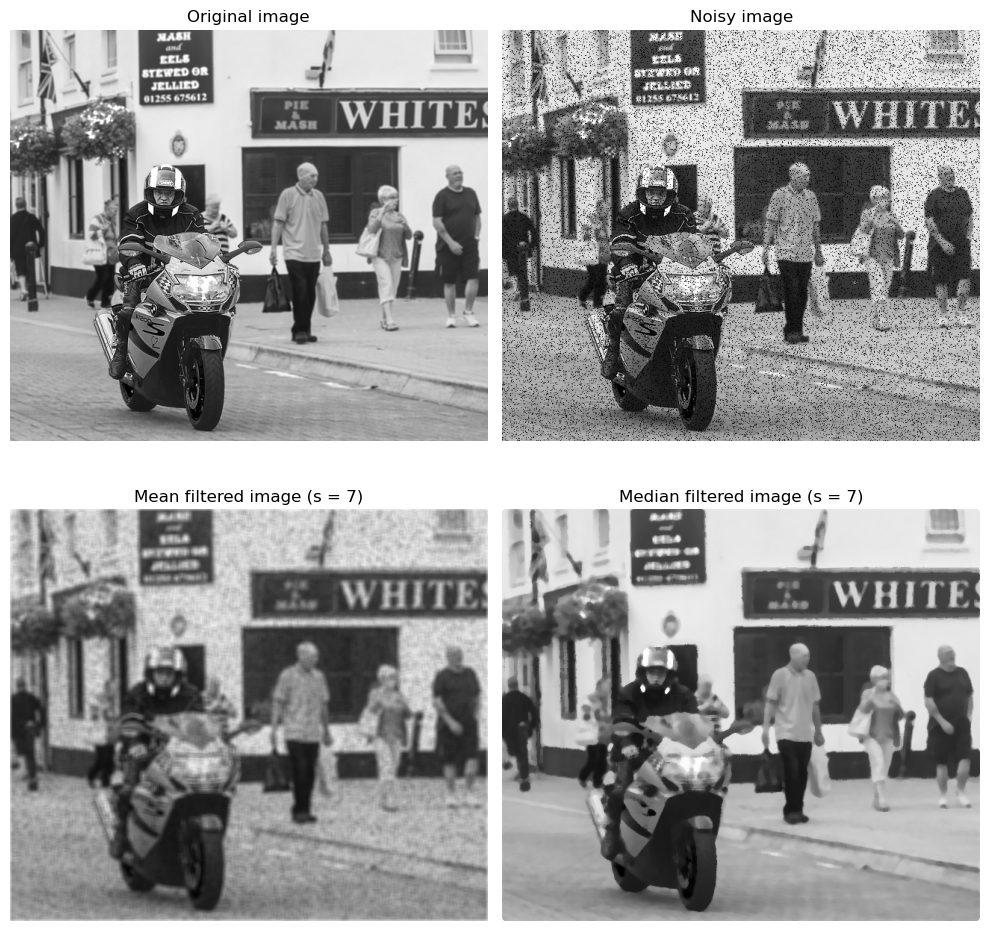

In [15]:
plt.figure(figsize=(10,10))

plt.subplot(2,2,1)
plt.imshow(motorbike_gray,cmap='gray',vmin=0,vmax=1)
plt.title('Original image')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(noisy_motorbike,cmap='gray',vmin=0,vmax=1)
plt.title('Noisy image')
plt.axis('off')

plt.subplot(2,2,3)
plt.imshow(mean_filtered_img7,cmap='gray',vmin=0,vmax=1)
plt.title('Mean filtered image (s = 7)')
plt.axis('off')

plt.subplot(2,2,4)
plt.imshow(median_filtered_img7,cmap='gray',vmin=0,vmax=1)
plt.title('Median filtered image (s = 7)')
plt.axis('off')

plt.tight_layout()

When the value of `s` increases to `5` and `7`, the behavior of the mean and median filters change. 

The mean filter leads to more blurring as `s` increases. Since the mean filter still takes the average, increasing the `s` just means that there is a larger grid to take the average of. This leads to a blurry image with still significant amounts of salt-and-pepper noise. It is not sufficient for clearing up salt-and-pepper noise and the edges become more blurred as `s` increases. 

For the median filter, when `s` increases, it appears to get rid of a lot of original salt-and-pepper noise. The picture looks clearer but there is a smoothness there that is not in the original photo. Some details are harder to make out (e.g the motorbike driver's face) and the photo looks smooth

## What happens as the level of noise in an image is increased?

Here, we can increase the level of noise to `25%` to see how our image changes and how well our filters work now.

(-0.5, 639.5, 551.5, -0.5)

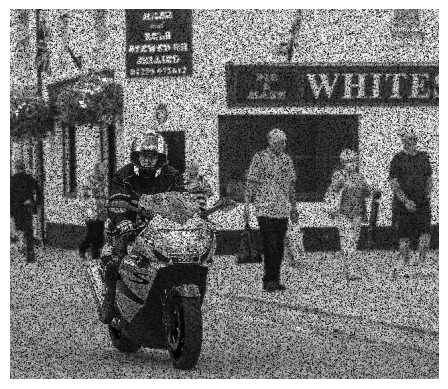

In [16]:
noisier_motorbike = sp_noise(motorbike_gray, .25)
plt.imshow(noisier_motorbike, cmap='gray', vmin=0, vmax=1)
plt.axis('off')

(-0.5, 639.5, 551.5, -0.5)

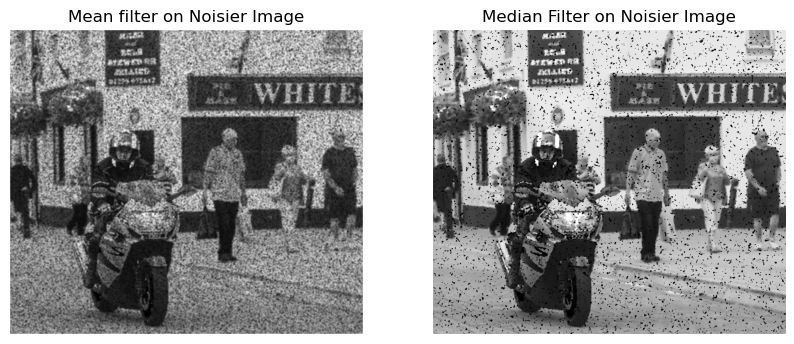

In [17]:
# Test out filters with the new noise level
padded_img = get_padded_img(noisier_motorbike, s=3)
mean_filtered_noisier_img = mean_filter(noisier_motorbike, s=3)
median_filtered_noisier_img = median_filter(noisier_motorbike, s=3)

plt.figure(figsize=(10,10))

plt.subplot(2,2,1)
plt.imshow(mean_filtered_noisier_img,cmap='gray',vmin=0,vmax=1)
plt.title('Mean filter on Noisier Image')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(median_filtered_noisier_img,cmap='gray',vmin=0,vmax=1)
plt.title('Median Filter on Noisier Image')
plt.axis('off')

As the level of salt-and-pepper noise increases in an image, the effectiveness of both filters clearly decreases. As you can see both filtered images are speckled with noise. Noise pixels outnumber our regular image pixels so it is much harder to clear out. 

As the level of noise increases, the median and mean filters both begin to fail in denoising salt-and-pepper noise. The Mean filter experiences a lot of blurring and the noise is barely cleared out at all (almost to the point where the picture is not readable). 

## Is there a way to improve the noise reduction performance of our filters? 

Following the general scheme of the mean and median filters I created, I created a new function (`img_filter(img,s, filter_func)` that could combine their capababilities using the `filter_func` function. Using the `filter_func`, we can combine `mean` and `median` into a single `filter` function that takes in our noisy image array and apply `filter_func` to each grid. It takes in a 2D array and returns a float. 

The function `filter_func` can process other functions like `np.mean` or `np.median` and then stores the value to return our `filtered_img`. It is very similar to both the `mean_filter(img, s)` and `median_filter(img, s)` but now it passes a third argument to make it more dynamic and efficient. 

In [18]:
def img_filter(img, s, filter_func):
    filtered_img = img.copy()
    num_rows, num_cols = img.shape
    
    # Flexible filtering that can change without needing to call separate args

    for i in range(num_rows):
        for j in range(num_cols):
            grid = padded_img[i:i + s, j:j + s]
            filtered_img[i,j] = filter_func(grid)
            
    return filtered_img

In [19]:
padded_img = get_padded_img(noisy_motorbike, s=3)
mean_img_filter = img_filter(noisy_motorbike,s=3,filter_func=np.mean)
median_img_filter = img_filter(noisy_motorbike,s=3,filter_func=np.median )

Text(0.5, 1.0, 'Median filtered image')

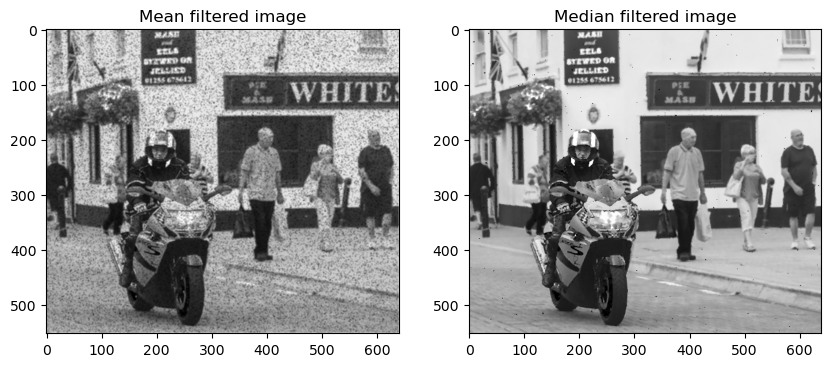

In [20]:
plt.figure(figsize=(10,10))

plt.subplot(2,2,1)
plt.imshow(mean_img_filter,cmap='gray',vmin=0,vmax=1)
plt.title('Mean filtered image')

plt.subplot(2,2,2)
plt.imshow(median_img_filter,cmap='gray',vmin=0,vmax=1)
plt.title('Median filtered image')

# Conclusions

For salt-and-pepper noise, the median filter is the most useful filter. It removes most of noise when the noise levels are at a low level but when noise increases, it starts to look speckled and the noise isn't removed as well. When the value of `s` increases, there is some oversmoothing that occurs with the median filter. 

I would conclude that the mean filter is ineffective compared to the median filter. At all the noise levels (although the higher the noise level the worse it got), the picture was still riddled with noise. As `s` increased the image was very blurry as well. 

At low levels of noise, median filter is effective but it does have its limits as noise levels increase. There may be other methods and median filters that can be better adapted to deal with these high levels of noise. 

# Sources

https://www.adobe.com/creativecloud/photography/hub/guides/what-is-noise-in-photography.html
https://medium.com/@abhishekjainindore24/salt-and-pepper-noise-and-how-to-remove-it-in-machine-learning-032d76b138a5

# Extra Credit

I used the `img_filter(img, s, filter_func)` to reduce the noise for the following images to a reasonable degree based on different values of `s`. 

In [21]:
ub_img1 = plt.imread('ub_noisy1.png')
ub_img1_gray = ub_img1.mean(axis=2)

ub_img2 = plt.imread('ub_noisy2.png')
ub_img2_gray = ub_img2.mean(axis=2)

ub_img3 = plt.imread('ub_noisy3.png')
ub_img3_gray = ub_img3.mean(axis=2)

ub_img4 = plt.imread('ub_noisy4.png')
ub_img4_gray = ub_img4.mean(axis=2)

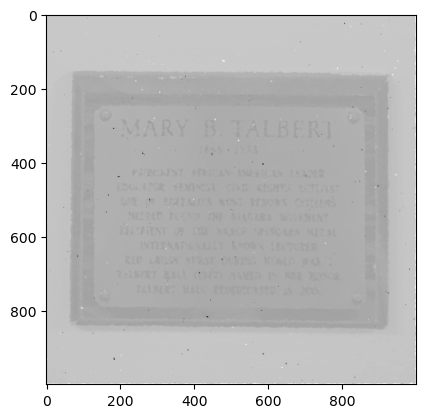

In [22]:
padded_img = get_padded_img(ub_img1_gray, s=7)
img_filter1 = img_filter(ub_img1_gray, s=7, filter_func=np.median)

plt.imshow(img_filter1, cmap='gray', vmin=0, vmax=1)

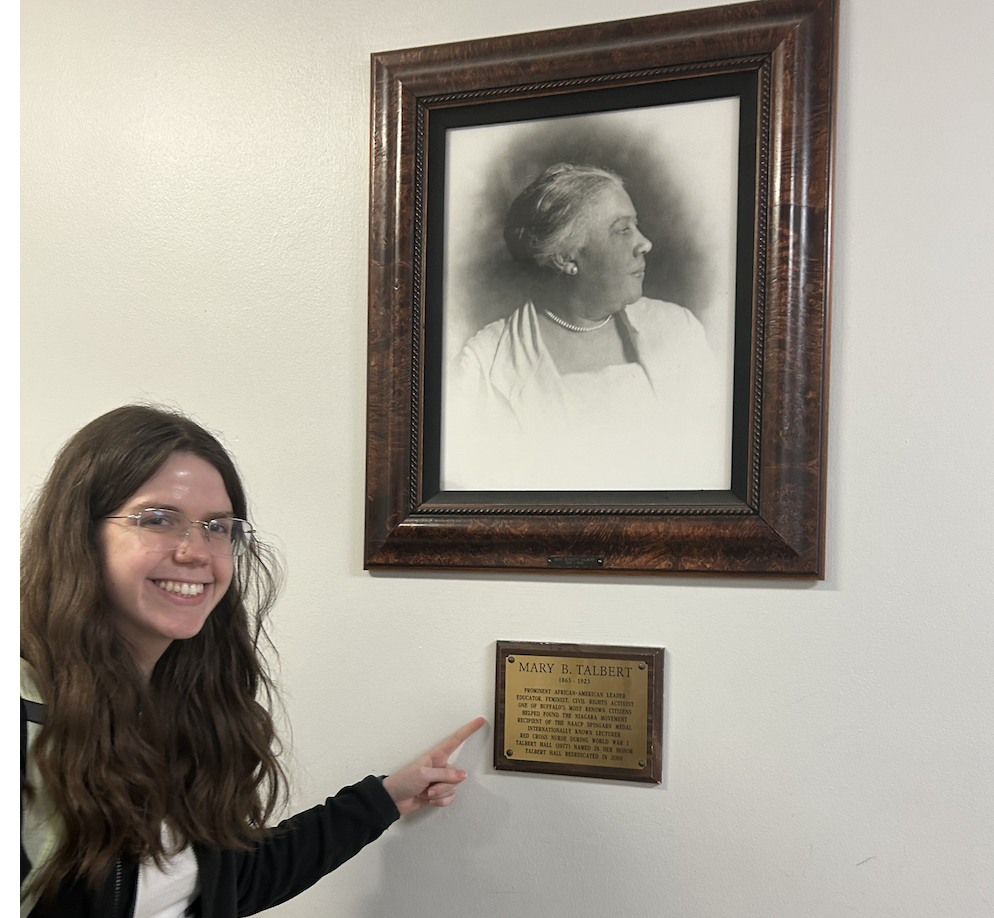

In [26]:
from IPython.display import Image
Image("ub_location1.png")

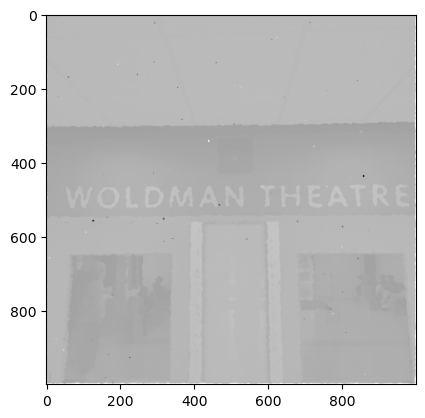

In [23]:
padded_img = get_padded_img(ub_img2_gray, s=9)
img_filter2 = img_filter(ub_img2_gray, s=9, filter_func=np.median)

plt.imshow(img_filter2, cmap='gray', vmin=0, vmax=1)

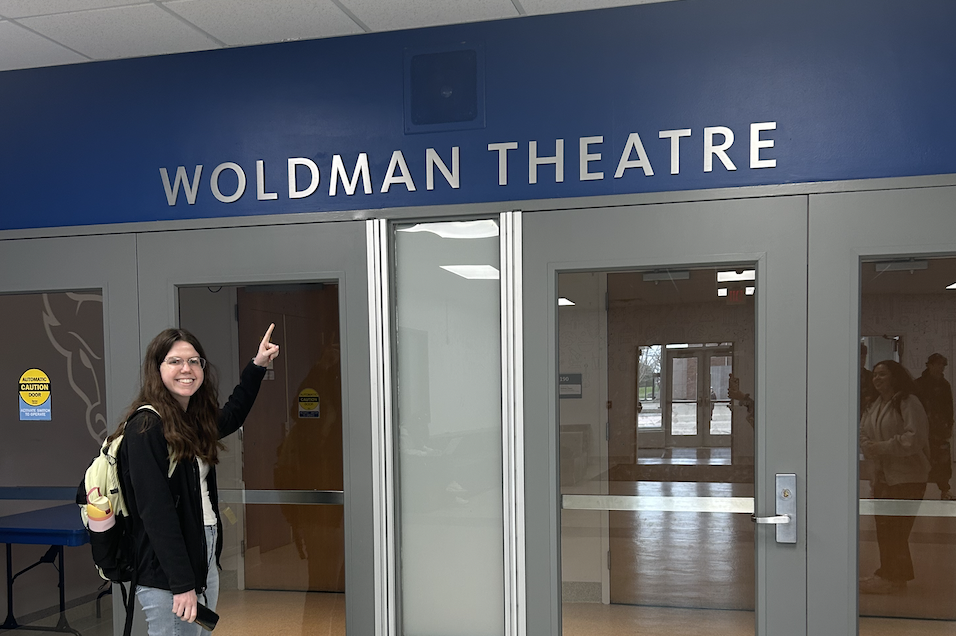

In [27]:
from IPython.display import Image
Image("ub_location2.png")

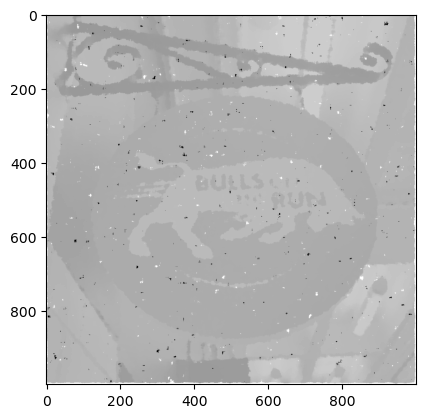

In [24]:
padded_img = get_padded_img(ub_img3_gray, s=11)
img_filter3 = img_filter(ub_img3_gray, s=11, filter_func=np.median)

plt.imshow(img_filter3, cmap='gray', vmin=0, vmax=1)

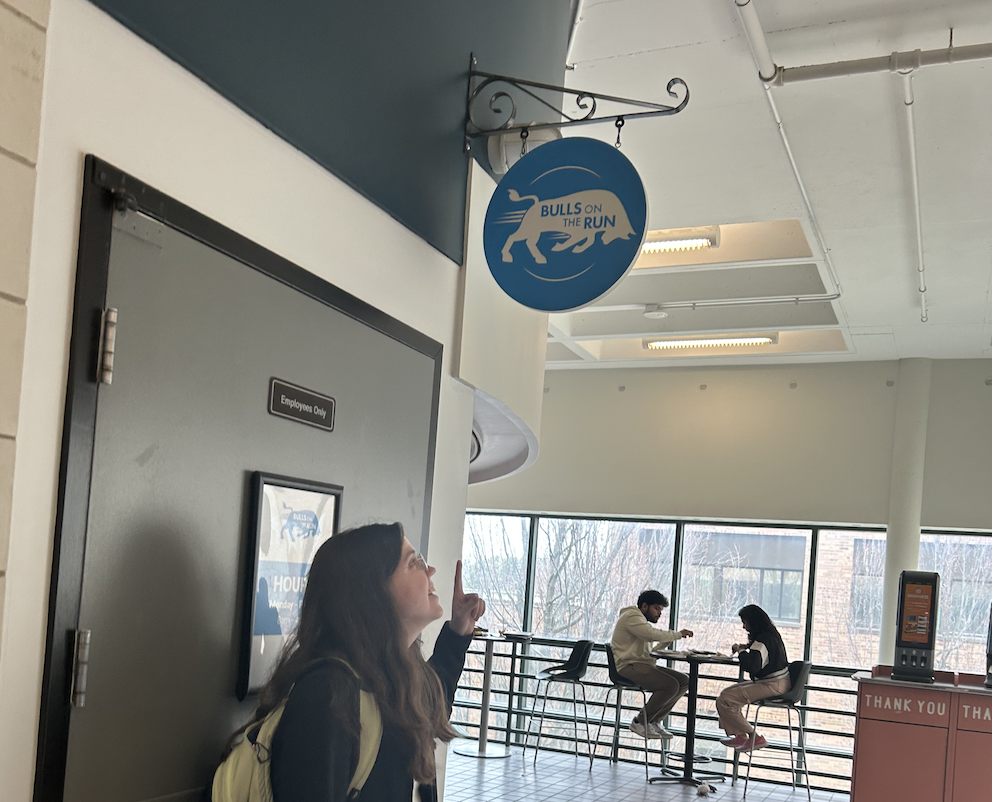

In [28]:
from IPython.display import Image
Image("ub_location3.png")

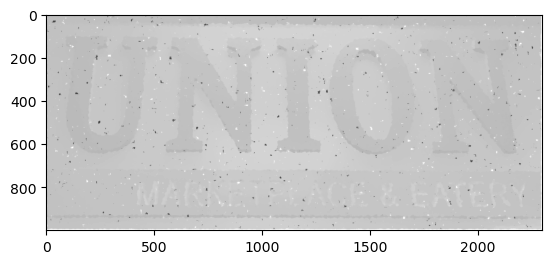

In [25]:
padded_img = get_padded_img(ub_img4_gray, s=13)
img_filter4 = img_filter(ub_img4_gray, s=13, filter_func=np.median)

plt.imshow(img_filter4, cmap='gray', vmin=0, vmax=1)

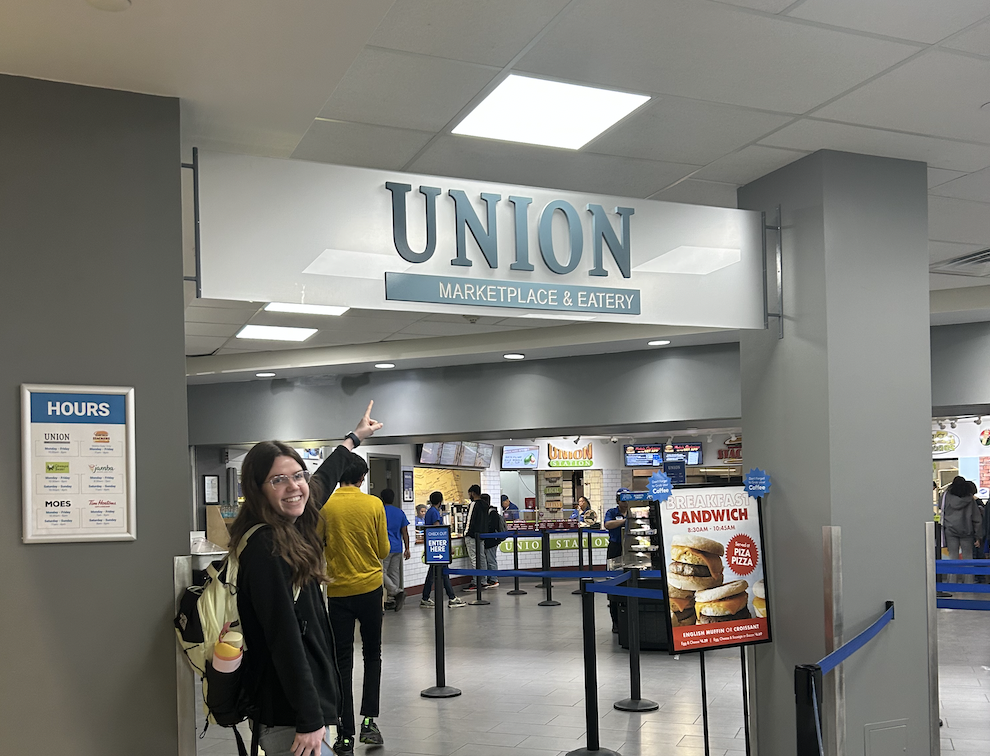

In [29]:
from IPython.display import Image
Image("ub_location4.png")